# Import Libraries

In [1]:
import numpy as np
import math
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
from matplotlib import cm as cms
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import branca.colormap as cm
from datetime import timedelta, date
import geoviews as gv
from bokeh.io import output_notebook
import holoviews as hv
from bokeh.models import HoverTool
import hvplot.pandas
import plotly.graph_objects as go
import plotly.express as px

# Load in wave data from API 

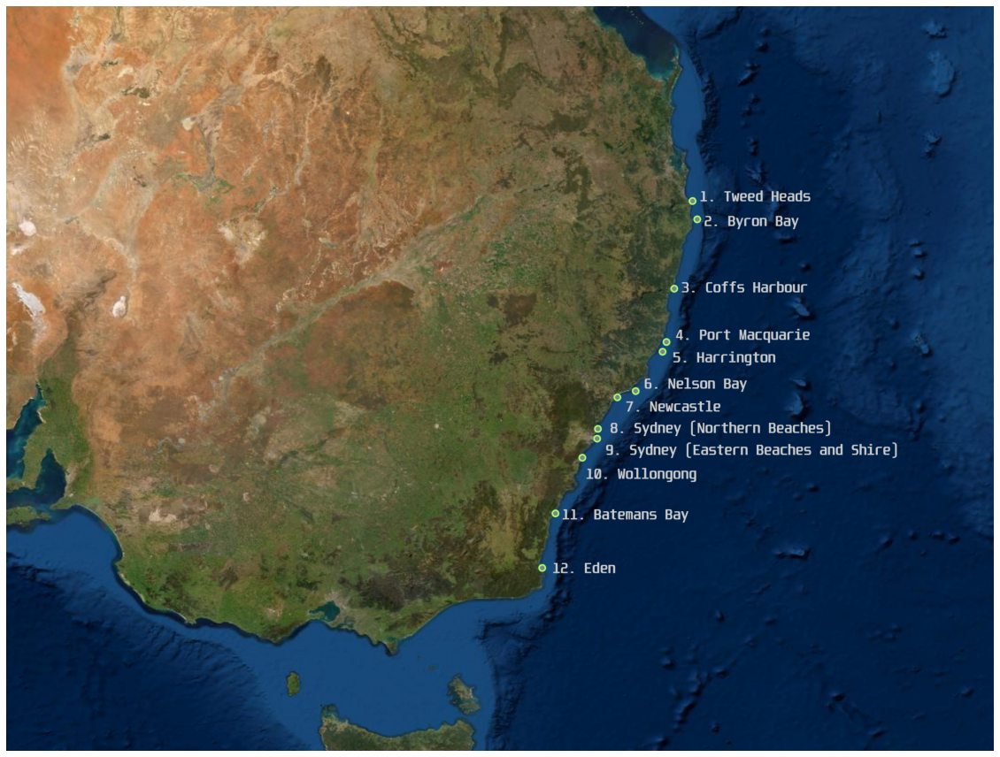

In [3]:
#define regions 
region1 = "1000001,1000002,1000003,1000004,1000005,1000006,1000007,1000008,1000009,1000010,1000011,1000012,1000013,1000014,1000015,1000016,1000017,1000018,1000019,1000020,1000021,1000022,1000023,1000024,1000025,1000026,1000027,1000028,1000029,1000030,1000031,1000032,1000033,1000034,1000035,1000036,1000037,1000038,1000039,1000040,1000041,1000042,1000043,1000044,1000045,1000046,1000047,1000048,1000049,1000050,1000051,1000052,1000053,1000054,1000055,1000056,1000057,1000058,1000059,1000060,1000061,1000062,1000063,1000064,1000065,1000066,1000067,1000068,1000069,1000070,1000071,1000072,1000073,1000074,1000075,1000076,1000077,1000078,1000079,1000080,1000081,1000082,1000083,1000084,1000085,1000086,1000087,1000088,1000089,1000090,1000091,1000092,1000093,1000094,1000095,1000096,1000097,1000098,1000099,1000100,1000101,1000102,1000103,1000104,1000110,1000109,1000108,1000112,1000105,1000111,1000113,1000107,1000106,1000114,1000116,1000117,1000115,1000118,1000119,1000120,1000121,1000122,1000123,1000124,1000125,1000126,1000127,1000128,1000129,1000130,1000131,1000132,1000133,1000134,1000135,1000136,1000137,1000138,1000139,1000140,1000141,1000142,1000143,1000144,1000145,1000146,1000147,1000148,1000149,1000150,1000151,1000152,1000153,1000154,1000155,1000156,1000157,1000158,1000159,1000160,1000161,1000162,1000163,1000164,1000165,1000166,1000167,1000168,1000169,1000170,1000171,1000172,1000173,1000174,1000175,1000176,1000177,1000178,1000179,1000180,1000181,1000182,1000183,1000184,1000185,1000186,1000187,1000188,1000189,1000190,1000191,1000192,1000193,1000194,1000195,1000196,1000197,1000198,1000199,1000200,1000201,1000202,1000203,1000204,1000205,1000206,1000207,1000208,1000209,1000210,1000211,1000212,1000213,1000214,1000215,1000216,1000217,1000218,1000219,1000220,1000221,1000222,1000223,1000224,1000225,1000226,1000227,1000228,1000229,1000230,1000231,1000232,1000233,1000234,1000235,1000236,1000237,1000238,1000239,1000240,1000241"
region2 = "1000494,1000495,1000496,1000497,1000498,1000499,1000500,1000501,1000502,1000503,1000504,1000505,1000506,1000507,1000508,1000509,1000510,1000511,1000512,1000513,1000514,1000515,1000516,1000556,1000557,1000555,1000558,1000517,1000554,1000559,1000553,1000518,1000552,1000551,1000560,1000519,1000550,1000549,1000548,1000547,1000520,1000546,1000561,1000545,1000544,1000543,1000542,1000562,1000521,1000541,1000538,1000539,1000540,1000536,1000535,1000532,1000533,1000534,1000537,1000522,1000523,1000528,1000529,1000530,1000531,1000524,1000527,1000563,1000525,1000526,1000564,1000565,1000566,1000567,1000568,1000569,1000570,1000571,1000572,1000573,1000574,1000575,1000576,1000577,1000578,1000579,1000580,1000581,1000582,1000583,1000584,1000585,1000586,1000587,1000588,1000589,1000590,1000591,1000592,1000593,1000594,1000595,1000596,1000597,1000598,1000599,1000600,1000601,1000602,1000603,1000604,1000605,1000606,1000607,1000608,1000609,1000610,1000611,1000612,1000613,1000614,1000615,1000616,1000617,1000618,1000619,1000620,1000621,1000622,1000623,1000624,1000625,1000626,1000627,1000628,1000629,1000630,1000631,1000632,1000633,1000634,1000635,1000636,1000637,1000638,1000639,1000640,1000641,1000642,1000643,1000644"
region3 = "1002329,1002330,1002331,1002332,1002333,1002334,1002335,1002336,1002337,1002338,1002339,1002340,1002341,1002342,1002343,1002344,1002345,1002346,1002347,1002348,1002349,1002350,1002351,1002352,1002353,1002354,1002355,1002356,1002357,1002358,1002359,1002360,1002361,1002362,1002363,1002364,1002365,1002366,1002367,1002368,1002369,1002370,1002371,1002372,1002373,1002374,1002375,1002376,1002377,1002378,1002379,1002380,1002381,1002382,1002383,1002384,1002385,1002386,1002387,1002388,1002389,1002390,1002391,1002392,1002393,1002397,1002394,1002398,1002396,1002395,1002399,1002400,1002401,1002402,1002403,1002404,1002405,1002406,1002407,1002408,1002409,1002410,1002411,1002412,1002413,1002414,1002415,1002416,1002417,1002418,1002419,1002420,1002421,1002422,1002423,1002424,1002425,1002426,1002427,1002428,1002429,1002430,1002431,1002432,1002433,1002434,1002435,1002436,1002437,1002438,1002439,1002440,1002441,1002442,1002443,1002444,1002445,1002446,1002447,1002448,1002449,1002450,1002451,1002452,1002453,1002454,1002455,1002456,1002457,1002458,1002459,1002460,1002461,1002462,1002463,1002464,1002465,1002466,1002467,1002468,1002469,1002470,1002471,1002472,1002473,1002474,1002475,1002476,1002477,1002478,1002479,1002480,1002481,1002482,1002483,1002484,1002485,1002486,1002487,1002488,1002489,1002490,1002491,1002492,1002493,1002494,1002495,1002496,1002497,1002498,1002499,1002500,1002501,1002502,1002503,1002504,1002505,1002506,1002507,1002508,1002509,1002510,1002511,1002512,1002513,1002514,1002515,1002516,1002517,1002518,1002519,1002520,1002521,1002522,1002523,1002524,1002525,1002526,1002527,1002528,1002529,1002530,1002531,1002532,1002533,1002534,1002535,1002536,1002537,1002538,1002539,1002540,1002541,1002542,1002543,1002544,1002545,1002546,1002547,1002548,1002549,1002550,1002551,1002552,1002558,1002557,1002559,1002560,1002553,1002556,1002554,1002555,1002561,1002562,1002563,1002564,1002565,1002566,1002567,1002568,1002569,1002570,1002571,1002572,1002573,1002574,1002575,1002576,1002577,1002578,1002579,1002580,1002581,1002582,1002583,1002584,1002585,1002586,1002587,1002588,1002589,1002590,1002591,1002592,1002593,1002594,1002595,1002596,1002597,1002598,1002599,1002600,1002601,1002602,1002603,1002604,1002605,1002606,1002607,1002608,1002609,1002610,1002611,1002612,1002613,1002614,1002615,1002616,1002617,1002618,1002619,1002620,1002621,1002622,1002623,1002624,1002625,1002626,1002627,1002628,1002629,1002630,1002631,1002632,1002633,1002634,1002635,1002636,1002637,1002638,1002639,1002640,1002641,1002642,1002643,1002644,1002645,1002646,1002647,1002648,1002649,1002650,1002651,1002652,1002653,1002654,1002655,1002656,1002657,1002658,1002659,1002660,1002661,1002662,1002663,1002664,1002665,1002666,1002667,1002668,1002669,1002670,1002671,1002672,1002673,1002674,1002675,1002676,1002677,1002678,1002679,1002680,1002681,1002682,1002683,1002684,1002685,1002686,1002687,1002688,1002689,1002690,1002691,1002692,1002693,1002694,1002695,1002696,1002697,1002698,1002699,1002700,1002701,1002702,1002703,1002704,1002705,1002706,1002707,1002708,1002709,1002710,1002711,1002712,1002713,1002714"
region4 = "1002329,1002330,1002331,1002332,1002333,1002334,1002335,1002336,1002337,1002338,1002339,1002340,1002341,1002342,1002343,1002344,1002345,1002346,1002347,1002348,1002349,1002350,1002351,1002352,1002353,1002354,1002355,1002356,1002357,1002358,1002359,1002360,1002361,1002362,1002363,1002364,1002365,1002366,1002367,1002368,1002369,1002370,1002371,1002372,1002373,1002374,1002375,1002376,1002377,1002378,1002379,1002380,1002381,1002382,1002383,1002384,1002385,1002386,1002387,1002388,1002389,1002390,1002391,1002392,1002393,1002397,1002394,1002398,1002396,1002395,1002399,1002400,1002401,1002402,1002403,1002404,1002405,1002406,1002407,1002408,1002409,1002410,1002411,1002412,1002413,1002414,1002415,1002416,1002417,1002418,1002419,1002420,1002421,1002422,1002423,1002424,1002425,1002426,1002427,1002428,1002429,1002430,1002431,1002432,1002433,1002434,1002435,1002436,1002437,1002438,1002439,1002440,1002441,1002442,1002443,1002444,1002445,1002446,1002447,1002448,1002449,1002450,1002451,1002452,1002453,1002454,1002455,1002456,1002457,1002458,1002459,1002460,1002461,1002462,1002463,1002464,1002465,1002466,1002467,1002468,1002469,1002470,1002471,1002472,1002473,1002474,1002475,1002476,1002477,1002478,1002479,1002480,1002481,1002482,1002483,1002484,1002485,1002486,1002487,1002488,1002489,1002490,1002491,1002492,1002493,1002494,1002495,1002496,1002497,1002498,1002499,1002500,1002501,1002502,1002503,1002504,1002505,1002506,1002507,1002508,1002509,1002510,1002511,1002512,1002513,1002514,1002515,1002516,1002517,1002518,1002519,1002520,1002521,1002522,1002523,1002524,1002525,1002526,1002527,1002528,1002529,1002530,1002531,1002532,1002533,1002534,1002535,1002536,1002537,1002538,1002539,1002540,1002541,1002542,1002543,1002544,1002545,1002546,1002547,1002548,1002549,1002550,1002551,1002552,1002558,1002557,1002559,1002560,1002553,1002556,1002554,1002555,1002561,1002562,1002563,1002564,1002565,1002566,1002567,1002568,1002569,1002570,1002571,1002572,1002573,1002574,1002575,1002576,1002577,1002578,1002579,1002580,1002581,1002582,1002583,1002584,1002585,1002586,1002587,1002588,1002589,1002590,1002591,1002592,1002593,1002594,1002595,1002596,1002597,1002598,1002599,1002600,1002601,1002602,1002603,1002604,1002605,1002606,1002607,1002608,1002609,1002610,1002611,1002612,1002613,1002614,1002615,1002616,1002617,1002618,1002619,1002620,1002621,1002622,1002623,1002624,1002625,1002626,1002627,1002628,1002629,1002630,1002631,1002632,1002633,1002634,1002635,1002636,1002637,1002638,1002639,1002640,1002641,1002642,1002643,1002644,1002645,1002646,1002647,1002648,1002649,1002650,1002651,1002652,1002653,1002654,1002655,1002656,1002657,1002658,1002659,1002660,1002661,1002662,1002663,1002664,1002665,1002666,1002667,1002668,1002669,1002670,1002671,1002672,1002673,1002674,1002675,1002676,1002677,1002678,1002679,1002680,1002681,1002682,1002683,1002684,1002685,1002686,1002687,1002688,1002689,1002690,1002691,1002692,1002693,1002694,1002695,1002696,1002697,1002698,1002699,1002700,1002701,1002702,1002703,1002704,1002705,1002706,1002707,1002708,1002709,1002710,1002711,1002712,1002713,1002714"
region5 = "1004421,1004422,1004423,1004424,1004425,1004426,1004427,1004428,1004429,1004430,1004431,1004432,1004433,1004434,1004435,1004436,1004437,1004438,1004439,1004440,1004441,1004442,1004443,1004444,1004445,1004446,1004447,1004448,1004449,1004450,1004451,1004452,1004453,1004454,1004455,1004458,1004456,1004457,1004459,1004460,1004461,1004462,1004463,1004464,1004465,1004466,1004467,1004468,1004469,1004470,1004471,1004472,1004473,1004474,1004475,1004476,1004477,1004478,1004479,1004480,1004481,1004482,1004483,1004484,1004485,1004486,1004487,1004488,1004489,1004490,1004491,1004492,1004493,1004494,1004495,1004496,1004497,1004498,1004499,1004500,1004501,1004502,1004503,1004504,1004505,1004506,1004507,1004508,1004509,1004510,1004511,1004512,1004513,1004514,1004515,1004516,1004517,1004518,1004519,1004520,1004521,1004522,1004523,1004524,1004525,1004526,1004527,1004528,1004529,1004530,1004531,1004532,1004533,1004534,1004535,1004536,1004537,1004538,1004539,1004540,1004541,1004542,1004543,1004544,1004545,1004546,1004547,1004548,1004549,1004550,1004551,1004552,1004553,1004554,1004555,1004556,1004557,1004558,1004559,1004560,1004561,1004562,1004563,1004564,1004565,1004566,1004570,1004568,1004569,1004567,1004571,1004572,1004573,1004574,1004575,1004576,1004577,1004578,1004579,1004580,1004581,1004582,1004583,1004584,1004585,1004586,1004587,1004588,1004589,1004590,1004591,1004592,1004593,1004594,1004601,1004595,1004600,1004602,1004596,1004603,1004599,1004604,1004605,1004597,1004598,1004606,1004607,1004608,1004609,1004610,1004611,1004612,1004613,1004614,1004615,1004616,1004617,1004618,1004619,1004620,1004621,1004622,1004623,1004624,1004625,1004626,1004627,1004628,1004629,1004630,1004631,1004632,1004633,1004634,1004635,1004636,1004637,1004638,1004639,1004640,1004641,1004642,1004643,1004644,1004645,1004646,1004647,1004648,1004649,1004650,1004651,1004652,1004653,1004654,1004655,1004656,1004657,1004658,1004659,1004660,1004661,1004662,1004663,1004664,1004665,1004666,1004667,1004668,1004669,1004670,1004671,1004672,1004673,1004674,1004675,1004676,1004677,1004678,1004679,1004680,1004681,1004682,1004683,1004684,1004685,1004686,1004687,1004688,1004689,1004690,1004691,1004692,1004693,1004694,1004695,1004696,1004697,1004698,1004699,1004700,1004701,1004702,1004703,1004704,1004705,1004706,1004707,1004708,1004709,1004710,1004711,1004712,1004713,1004714,1004715,1004716,1004717,1004718,1004719,1004720,1004721,1004722,1004723,1004724,1004725,1004726,1004727,1004728,1004729,1004730,1004731,1004732,1004733,1004734,1004735,1004736,1004737,1004738,1004739,1004740,1004741,1004742,1004743,1004744,1004745,1004746,1004747,1004748,1004749,1004750,1004751,1004752,1004753,1004754,1004755,1004756,1004757,1004758,1004759,1004760,1004761,1004762,1004763,1004764,1004765,1004766,1004767,1004768,1004769,1004770,1004771,1004772,1004773,1004774,1004775,1004776,1004777,1004778,1004779,1004780,1004781,1004782,1004783,1004784,1004785,1004786,1004787,1004788,1004789,1004790,1004791,1004793,1004792,1004794,1004795,1004796,1004797,1004798,1004799,1004800,1004801,1004802,1004803,1004804,1004805,1004806,1004807,1004808,1004809,1004810,1004811,1004813,1004812,1004814,1004815,1004816,1004817,1004818,1004819,1004820,1004821,1004822,1004823,1004824,1004825,1004826,1004827,1004828,1004829,1004830,1004831,1004832,1004835,1004833,1004836,1004834,1004837,1004838,1004839,1004840,1004841,1004842,1004843,1004844,1004845,1004846,1004847,1004848,1004849,1004850,1004851,1004852,1004853,1004854,1004855,1004856,1004857,1004858,1004859,1004860,1004861"
region6 = "1005923,1005924,1005925,1005926,1005927,1005928,1005929,1005930,1005931,1005932,1005933,1005934,1005935,1005936,1005937,1005938,1005939,1005940,1005941,1005942,1005943,1005944,1005945,1005946,1005947,1005948,1005949,1005950,1005951,1005952,1005953,1005954,1005961,1005960,1005958,1005962,1005955,1005959,1005963,1005956,1005957,1005964,1005965,1005966,1005967,1005968,1005969,1006018,1006019,1006017,1006020,1005970,1006021,1006022,1006016,1006023,1006024,1006025,1006026,1005971,1006027,1006015,1006014,1006028,1005972,1006013,1006029,1006012,1005973,1005985,1005984,1005974,1006030,1005986,1006011,1005983,1005975,1005987,1006010,1006031,1005988,1005976,1005981,1005982,1006009,1005977,1005989,1006032,1005980,1005979,1006008,1005978,1006007,1005990,1006006,1006033,1005994,1005993,1005991,1005992,1006034,1006005,1005995,1006004,1005999,1005996,1005998,1005997,1006000,1006003,1006001,1006035,1006036,1006002,1006037,1006038,1006039,1006040,1006045,1006044,1006046,1006041,1006043,1006042,1006047,1006048,1006050,1006049,1006051,1006052,1006053,1006067,1006068,1006054,1006065,1006066,1006055,1006069,1006064,1006062,1006061,1006060,1006063,1006070,1006056,1006071,1006059,1006075,1006074,1006057,1006058,1006072,1006073,1006076,1006077,1006078,1006079,1006080,1006081,1006082,1006083,1006084,1006085,1006086,1006088,1006091,1006087,1006092,1006090,1006089,1006093,1006094,1006095,1006096,1006097,1006098,1006099,1006104,1006105,1006100,1006106,1006103,1006101,1006102,1006107,1006108,1006109,1006110,1006111,1006112,1006113,1006114,1006115,1006116,1006117,1006118,1006119,1006120,1006121,1006122,1006123,1006124,1006125,1006126,1006127,1006129,1006128,1006130,1006131,1006132,1006135,1006134,1006136,1006133,1006137,1006138,1006140,1006139,1006141,1006142,1006201,1006202,1006203,1006204,1006205,1006206,1006207,1006208,1006200,1006209,1006143,1006210,1006211,1006212,1006213,1006214,1006215,1006216,1006217,1006218,1006219,1006144,1006220,1006221,1006174,1006222,1006173,1006198,1006199,1006223,1006224,1006225,1006226,1006145,1006175,1006197,1006227,1006156,1006157,1006228,1006159,1006176,1006229,1006177,1006230,1006146,1006158,1006179,1006180,1006155,1006178,1006196,1006231,1006147,1006150,1006160,1006172,1006232,1006149,1006181,1006148,1006151,1006195,1006233,1006154,1006161,1006189,1006152,1006153,1006234,1006182,1006235,1006162,1006187,1006188,1006190,1006236,1006163,1006164,1006171,1006186,1006237,1006183,1006185,1006184,1006238,1006194,1006165,1006166,1006170,1006191,1006239,1006192,1006240,1006193,1006241,1006167,1006242,1006169,1006243,1006168,1006244,1006245,1006246,1006247,1006248,1006249,1006250,1006251,1006252,1006253,1006254,1006255,1006256,1006257,1006258,1006259,1006260,1006261,1006262,1006263,1006264,1006265,1006266,1006267,1006268,1006269,1006270,1006271,1006272,1006273,1006276,1006275,1006274,1006277,1006278,1006279,1006280,1006281,1006282,1006283,1006284,1006285,1006286,1006287,1006288,1006289,1006290,1006291,1006292,1006293,1006294,1006295,1006296,1006297,1006298,1006299,1006300,1006301,1006302,1006303,1006304,1006305,1006306,1006307,1006308,1006309,1006310,1006311,1006312,1006313,1006314,1006315,1006316,1006317,1006318,1006319,1006320,1006321,1006322,1006323,1006324,1006325,1006326,1006327,1006328,1006329,1006330,1006331,1006332,1006333,1006334,1006335,1006336,1006337,1006338,1006339,1006340,1006341,1006342,1006343,1006344,1006345,1006346,1006347,1006348,1006349,1006350,1006351,1006352,1006353,1006354,1006355,1006356,1006357,1006358,1006359,1006360,1006361,1006362,1006363,1006364,1006365,1006366,1006367,1006368,1006369,1006370,1006371,1006372,1006373,1006374,1006375,1006376,1006377,1006378,1006379,1006380,1006381,1006382,1006383,1006384,1006385,1006386,1006387,1006388,1006389,1006390,1006391,1006392,1006393,1006394,1006395,1006396,1006397,1006398,1006399,1006400,1006401,1006402,1006403,1006404,1006405,1006406,1006407,1006408,1006409,1006410,1006411,1006412,1006413,1006414,1006415,1006416,1006417,1006418,1006419,1006420"
region7 = "1006421,1006422,1006423,1006424,1006425,1006426,1006427,1006428,1006429,1006430,1006431,1006432,1006433,1006434,1006435,1006436,1006437,1006438,1006439,1006440,1006441,1006442,1006443,1006444,1006445,1006446,1006447,1006448,1006449,1006450,1006451,1006452,1006453,1006454,1006455,1006456,1006457,1006458,1006459,1006460,1006461,1006462,1006463,1006464,1006465,1006466,1006467,1006468,1006469,1006470,1006471,1006472,1006473,1006474,1006475,1006476,1006477,1006478,1006479,1006480,1006481,1006482,1006483,1006484,1006485,1006486,1006487,1006488,1006489,1006490,1006491,1006492,1006493,1006494,1006495,1006496,1006497,1006498,1006499,1006500,1006501,1006502,1006503,1006504,1006505,1006506,1006507,1006508,1006509,1006510,1006511,1006512,1006513,1006514,1006515,1006516,1006517,1006518,1006519,1006520,1006521,1006522,1006523,1006524,1006525,1006526,1006527,1006528,1006529,1006530,1006531,1006532,1006533,1006534,1006535,1006536,1006537,1006538,1006539,1006540,1006541,1006542,1006543,1006544,1006545,1006546,1006547,1006548,1006549,1006550,1006551,1006552,1006553,1006554,1006555,1006556,1006557,1006558,1006559,1006560,1006561,1006562,1006563,1006564,1006565,1006566,1006567,1006568,1006569,1006570,1006571,1006572,1006573,1006574,1006575,1006576,1006577,1006578,1006579,1006580,1006581,1006582,1006583,1006584,1006585,1006586,1006587,1006588,1006589,1006590,1006591,1006592,1006593,1006594,1006595,1006596,1006597,1006598,1006599,1006600,1006601,1006602,1006603,1006604,1006605,1006606,1006607,1006608,1006609,1006610,1006611,1006612,1006613,1006614,1006615,1006616,1006617,1006618,1006619,1006620,1006621,1006622,1006623,1006624,1006625,1006626,1006627,1006628,1006629,1006630,1006631,1006632,1006633,1006634,1006635,1006636,1006637,1006638,1006639,1006640,1006641,1006642,1006643,1006644,1006645,1006646,1006647,1006648,1006649,1006650,1006651,1006652,1006653,1006654,1006655,1006656,1006657,1006658,1006659,1006660,1006661,1006662,1006663,1006664,1006665,1006666,1006667,1006668,1006669,1006670,1006671,1006672,1006673,1006674,1006675,1006676,1006677,1006678,1006679,1006680,1006681,1006682,1006683,1006684,1006685,1006686,1006687,1006688,1006689,1006690,1006691,1006692,1006693,1006694,1006695,1006696,1006697,1006698,1006699,1006700,1006701,1006702,1006703,1006704,1006705,1006706,1006707,1006708,1006709,1006710,1006711,1006712,1006713,1006714,1006715,1006716,1006717,1006718,1006719,1006720,1006721,1006722,1006723,1006724,1006725,1006726,1006727,1006728,1006729,1006730,1006731,1006732,1006733,1006734,1006735,1006736,1006737,1006738,1006739,1006740,1006741,1006742,1006743,1006744,1006745,1006746,1006747,1006748,1006749,1006750,1006751,1006752,1006753,1006754,1006755,1006756,1006757,1006758,1006759,1006760,1006761,1006762,1006763,1006764,1006765,1006766,1006767,1006768,1006769,1006773,1006772,1006774,1006770,1006775,1006771,1006777,1006776,1006778,1006779"
region8 = "1007580,1007581,1007582,1007583,1007584,1007585,1007586,1007587,1007588,1007589,1007590,1007591,1007592,1007593,1007594,1007595,1007596,1007597,1007598,1007599,1007600,1007601,1007602,1007603,1007604,1007605,1007606,1007607,1007608,1007609,1007610,1007611,1007612,1007613,1007614,1007615,1007616,1007617,1007618,1007619,1007620,1007621,1007622,1007623,1007624,1007625,1007626,1007627,1007628,1007629,1007630,1007631,1007632,1007633,1007634,1007635,1007636,1007637,1007638,1007639,1007640,1007641,1007642,1007643,1007644,1007645,1007646,1007647,1007648,1007649,1007650,1007651,1007652,1007653,1007654,1007655,1007656,1007657,1007658,1007659,1007660,1007661,1007662,1007663,1007664,1007665,1007666,1007667,1007668,1007669,1007670,1007671,1007672,1007673,1007674,1007675,1007676,1007677,1007678,1007679,1007680,1007681,1007682,1007683,1007684,1007685,1007686,1007687,1007688,1007689,1007690,1007691,1007692,1007693,1007694,1007695,1007696,1007697,1007698,1007699,1007700,1007701,1007702,1007703,1007704,1007705,1007706,1007707,1007708,1007709,1007710,1007711,1007712,1007713,1007714,1007715,1007716,1007717,1007718,1007719,1007720,1007721,1007722,1007723,1007724,1007725,1007726,1007727,1007728,1007729,1007730,1007731,1007732,1007733,1007734,1007735,1007736,1007737,1007738,1007739,1007740,1007741,1007742,1007743,1007744,1007745,1007746,1007747,1007748,1007749,1007750,1007751,1007752,1007753,1007754,1007755,1007756,1007757,1007758,1007759,1007760,1007761,1007762,1007763,1007764,1007765,1007766,1007767,1007768,1007769,1007770,1007771,1007772,1007773,1007774,1007775,1007776,1007777,1007778,1007779,1007780,1007781,1007782,1007783,1007784,1007785,1007786,1007787,1007788,1007789,1007790,1007791,1007792,1007793,1007794,1007795,1007796,1007797,1007798,1007799,1007800,1007801,1007802,1007803,1007804,1007805,1007806,1007807,1007808,1007809,1007810,1007811,1007812,1007813,1007814,1007815,1007816,1007817,1007818,1007819,1007820,1007821,1007822,1007823,1007824,1007825,1007826,1007827,1007828,1007829,1007830,1007831,1007832,1007833,1007834,1007835,1007836,1007837,1007838,1007839,1007840,1007841,1007842,1007843,1007844,1007845,1007846,1007847,1007848,1007849,1007850,1007851,1007852,1007853,1007854,1007855,1007856,1007857,1007858,1007859,1007860,1007861,1007862,1007863,1007864,1007865,1007866,1007867,1007868,1007869,1007870,1007871,1007872,1007873,1007874,1007875,1007876,1007877,1007878,1007879,1007880,1007881,1007882,1007883,1007884,1007885,1007886,1007887,1007888,1007889,1007890,1007891,1007892,1007893,1007894,1007895,1007896,1007897,1007898,1007899,1007900,1007901,1007902,1007903,1007904,1007905,1007906,1007907,1007908,1007909,1007910,1007911,1007912,1007913,1007914,1007915,1007916,1007917,1007918,1007919,1007920,1007921,1007922,1007923,1007924,1007925,1007926,1007927,1007928,1007929,1007930,1007931,1007932,1007933"
region9 = "1007936,1007937,1007938,1007939,1007940,1007941,1007942,1007943,1007944,1007945,1007946,1007947,1007948,1007949,1007950,1007951,1007952,1007953,1007954,1007955,1007956,1007957,1007958,1007959,1007960,1007961,1007962,1007963,1007964,1007965,1007966,1007967,1007968,1007969,1007970,1007971,1007972,1007973,1007974,1007975,1007976,1007977,1007978,1007979,1007980,1007981,1007982,1007983,1007984,1007985,1007986,1007987,1007988,1007989,1007990,1007991,1007992,1007993,1007994,1007999,1007998,1007995,1008000,1008001,1007996,1007997,1008002,1008003,1008004,1008005,1008006,1008007,1008008,1008009,1008010,1008011,1008012,1008013,1008014,1008015,1008016,1008017,1008018,1008019,1008020,1008021,1008022,1008023,1008024,1008025,1008026,1008027,1008028,1008031,1008032,1008030,1008029,1008033,1008034,1008035,1008036,1008037,1008038,1008039,1008040,1008041,1008042,1008043,1008044,1008045,1008046,1008047,1008048,1008049,1008050,1008051,1008052,1008053,1008054,1008055,1008056,1008057,1008058,1008059,1008060,1008061,1008062,1008063,1008064,1008065,1008066,1008067,1008068,1008069,1008070,1008071,1008072,1008073,1008074,1008075,1008076,1008077,1008078,1008079,1008080,1008081,1008082,1008083,1008084,1008085,1008086,1008087,1008088,1008089,1008090,1008091,1008092,1008093,1008094,1008095,1008105,1008106,1008096,1008104,1008107,1008103,1008097,1008100,1008102,1008101,1008098,1008108,1008099,1008109,1008110,1008111,1008112,1008113,1008114,1008115,1008116,1008117,1008118,1008119,1008120,1008121,1008122,1008123,1008124,1008125,1008126,1008127,1008128,1008129,1008130,1008131,1008132,1008133,1008134,1008135,1008136,1008137,1008138,1008139,1008140,1008141,1008142,1008160,1008143,1008153,1008161,1008152,1008154,1008159,1008144,1008155,1008158,1008151,1008156,1008157,1008145,1008150,1008149,1008146,1008147,1008148,1008162,1008163,1008164,1008165,1008166,1008167,1008168,1008169,1008170,1008171,1008172,1008173,1008174,1008175,1008176,1008177,1008178,1008179,1008180,1008181,1008182,1008183,1008184,1008185,1008186,1008187,1008188,1008189,1008190,1008191,1008192,1008193,1008194,1008233,1008234,1008232,1008231,1008235,1008237,1008236,1008230,1008238,1008195,1008239,1008229,1008240,1008241,1008242,1008243,1008196,1008228,1008244,1008245,1008197,1008246,1008227,1008247,1008198,1008199,1008248,1008200,1008226,1008249,1008201,1008250,1008202,1008225,1008203,1008251,1008204,1008217,1008216,1008218,1008252,1008205,1008215,1008206,1008219,1008207,1008253,1008214,1008208,1008220,1008254,1008213,1008209,1008210,1008255,1008212,1008211,1008221,1008256,1008222,1008223,1008257,1008224,1008258,1008259,1008260,1008261,1008262,1008263,1008264,1008265,1008266,1008267,1008268,1008269,1008270,1008271,1008272,1008273,1008274,1008275,1008276,1008277,1008278,1008279,1008280,1008281,1008282,1008283,1008284,1008285,1008286,1008287,1008288,1008289,1008290,1008291"
region10 = "1008697,1008698,1008699,1008700,1008701,1008702,1008703,1008704,1008705,1008706,1008707,1008708,1008709,1008710,1008711,1008712,1008713,1008714,1008715,1008716,1008717,1008718,1008719,1008720,1008721,1008722,1008723,1008724,1008725,1008726,1008727,1008728,1008729,1008730,1008731,1008732,1008733,1008734,1008735,1008736,1008737,1008738,1008739,1008740,1008741,1008742,1008743,1008744,1008745,1008746,1008747,1008748,1008749,1008750,1008751,1008752,1008753,1008754,1008755,1008756,1008757,1008758,1008759,1008760,1008761,1008762,1008763,1008764,1008765,1008766,1008767,1008768,1008769,1008770,1008771,1008772,1008773,1008774,1008775,1008776,1008777,1008778,1008779,1008780,1008781,1008782,1008783,1008784,1008785,1008786,1008787,1008788,1008789,1008790,1008791,1008792,1008793,1008794,1008795,1008796,1008797,1008798,1008799,1008800,1008801,1008802,1008803,1008804,1008805,1008806,1008807,1008808,1008809,1008810,1008811,1008812,1008813,1008814,1008815,1008816,1008817,1008818,1008819,1008820,1008821,1008822,1008823,1008824,1008825,1008826,1008827,1008828,1008829,1008830,1008831,1008832,1008833,1008834,1008835,1008836,1008837,1008838,1008839,1008840,1008841,1008842,1008843,1008844,1008845,1008846,1008847,1008848,1008849,1008850,1008851,1008852,1008853,1008854,1008855"
region11 = "1010625,1010626,1010627,1010628,1010629,1010630,1010631,1010632,1010633,1010634,1010635,1010636,1010637,1010638,1010639,1010640,1010641,1010642,1010643,1010644,1010645,1010646,1010647,1010648,1010649,1010650,1010651,1010652,1010653,1010654,1010655,1010656,1010657,1010658,1010659,1010660,1010661,1010662,1010663,1010664,1010665,1010666,1010667,1010668,1010669,1010670,1010671,1010672,1010673,1010674,1010675,1010676,1010677,1010678,1010679,1010680,1010681,1010682,1010683,1010684,1010685,1010686,1010687,1010688,1010689,1010690,1010691,1010692,1010693,1010694,1010695,1010696,1010697,1010698,1010699,1010700,1010701,1010702,1010703,1010704,1010705,1010706,1010707,1010708,1010709,1010710,1010711,1010712,1010713,1010714,1010715,1010716,1010717,1010718,1010723,1010722,1010719,1010724,1010721,1010720,1010725,1010726,1010727,1010728,1010729,1010730,1010731,1010732,1010733,1010734,1010735,1010736,1010737,1010738,1010739,1010740,1010741,1010742,1010746,1010743,1010745,1010744,1010747,1010748,1010749,1010750,1010751,1010752,1010753,1010754,1010755,1010756,1010757,1010758,1010759,1010760,1010761,1010762,1010763,1010764,1010765,1010838,1010839,1010840,1010841,1010837,1010842,1010766,1010836,1010835,1010834,1010843,1010833,1010767,1010844,1010768,1010845,1010832,1010846,1010831,1010850,1010847,1010849,1010851,1010848,1010852,1010830,1010853,1010769,1010811,1010854,1010855,1010810,1010812,1010829,1010770,1010801,1010828,1010802,1010813,1010856,1010809,1010827,1010771,1010800,1010814,1010803,1010857,1010799,1010808,1010826,1010772,1010815,1010798,1010804,1010858,1010807,1010825,1010806,1010780,1010781,1010805,1010779,1010816,1010773,1010797,1010782,1010778,1010859,1010824,1010774,1010783,1010777,1010817,1010796,1010776,1010784,1010775,1010818,1010860,1010823,1010819,1010785,1010795,1010794,1010822,1010820,1010861,1010821,1010786,1010793,1010862,1010787,1010792,1010863,1010788,1010789,1010791,1010864,1010790,1010865,1010866,1010867,1010868,1010869,1010870,1010871,1010872,1010873,1010874,1010875,1010876,1010877,1010878,1010879,1010880,1010881,1010882,1010883,1010884,1010885,1010886,1010887,1010889,1010888,1010890,1010891,1010892,1010893,1010894,1010895,1010896,1010897,1010898,1010899,1010900,1010901,1010902,1010903,1010904,1010905,1010906,1010907,1010908,1010914,1010915,1010913,1010909,1010916,1010912,1010910,1010911,1010917,1010918,1010919,1010921,1010920,1010922,1010923,1010924,1010925,1010926,1010927,1010928,1010929,1010930,1010931,1010932,1010933,1010934,1010935,1010936,1010937,1010938,1010939,1010940,1010941,1010942,1010943,1010944,1010945,1010946,1010947,1010948,1010949,1010950,1010951,1010952,1010953,1010954,1010955,1010956,1010957,1010958,1010959,1010960,1010961,1010962,1010963,1010964,1010965,1010966,1010967,1010968,1010969,1010970,1010971,1010972,1010973,1010974,1010975,1010976,1010977,1010978,1010979,1010980,1010981,1010982,1010983,1010984,1010985,1010986,1010987,1010988,1010989,1010990,1010991,1010992,1010993,1010994,1011007,1011008,1011009,1011006,1011010,1010995,1011011,1011005,1011012,1011013,1011014,1011015,1010996,1011004,1011016,1011003,1010997,1011002,1010998,1011017,1011001,1010999,1011000,1011018,1011019,1011020,1011029,1011028,1011030,1011031,1011027,1011032,1011021,1011026,1011033,1011022,1011025,1011024,1011023,1011034,1011035,1011036,1011037,1011038,1011039,1011040,1011041,1011042,1011043,1011044,1011045,1011046,1011047,1011048,1011049,1011050,1011051,1011052,1011053,1011054,1011055,1011056,1011057,1011058,1011059,1011060,1011061,1011062,1011063,1011064,1011065,1011066,1011067,1011084,1011085,1011086,1011083,1011087,1011068,1011088,1011089,1011082,1011069,1011090,1011070,1011081,1011091,1011071,1011080,1011092,1011079,1011072,1011093,1011073,1011078,1011074,1011094,1011077,1011075,1011076,1011095,1011096,1011097,1011098,1011099,1011100,1011101,1011102,1011103,1011104,1011105,1011106,1011107,1011108,1011109,1011110,1011111,1011112,1011113,1011114,1011115,1011116,1011117,1011118,1011119,1011120,1011121,1011122,1011123,1011124,1011125,1011126,1011127,1011128,1011129,1011130"
region12 = "1012515,1012516,1012517,1012518,1012519,1012520,1012521,1012522,1012523,1012524,1012525,1012526,1012527,1012528,1012529,1012530,1012531,1012532,1012533,1012534,1012535,1012536,1012537,1012538,1012539,1012540,1012541,1012542,1012543,1012544,1012545,1012546,1012547,1012548,1012549,1012550,1012551,1012552,1012553,1012554,1012555,1012556,1012581,1012582,1012580,1012583,1012584,1012579,1012557,1012578,1012585,1012577,1012576,1012586,1012558,1012575,1012587,1012574,1012573,1012588,1012559,1012572,1012589,1012571,1012560,1012590,1012570,1012591,1012561,1012569,1012592,1012568,1012562,1012593,1012567,1012594,1012563,1012566,1012564,1012595,1012565,1012596,1012597,1012598,1012599,1012600,1012601,1012602,1012603,1012604,1012605,1012606,1012607,1012608,1012609,1012610,1012611,1012612,1012613,1012614,1012615,1012633,1012634,1012632,1012635,1012616,1012631,1012630,1012636,1012629,1012628,1012637,1012617,1012627,1012626,1012618,1012638,1012619,1012625,1012620,1012639,1012624,1012621,1012622,1012623,1012640,1012641,1012642,1012643,1012644,1012645,1012646,1012647,1012648,1012649,1012650,1012651,1012652,1012653,1012654,1012655,1012656,1012657,1012658,1012659,1012660,1012661,1012662,1012663,1012695,1012696,1012697,1012701,1012702,1012698,1012699,1012700,1012694,1012703,1012664,1012704,1012693,1012665,1012705,1012692,1012666,1012706,1012720,1012721,1012691,1012667,1012719,1012707,1012722,1012668,1012690,1012718,1012669,1012708,1012717,1012723,1012689,1012670,1012716,1012709,1012715,1012671,1012688,1012714,1012710,1012724,1012713,1012672,1012711,1012712,1012673,1012687,1012725,1012674,1012675,1012686,1012676,1012677,1012726,1012685,1012678,1012684,1012679,1012727,1012683,1012680,1012682,1012681,1012728,1012729,1012730,1012731,1012732,1012733,1012734,1012735,1012736,1012737,1012738,1012739,1012740,1012741,1012742,1012743,1012744,1012745,1012746,1012747,1012748,1012749,1012750,1012751,1012752,1012753,1012754,1012755,1012756,1012757,1012758,1012759,1012760,1012761,1012762,1012763,1012764,1012765,1012766,1012767,1012768,1012769,1012770,1012771,1012779,1012780,1012778,1012781,1012772,1012782,1012777,1012773,1012783,1012774,1012776,1012775,1012784,1012785,1012786,1012787,1012788,1012789,1012790,1012791,1012792,1012793,1012794,1012795,1012796,1012797,1012798,1012799,1012800,1012801,1012802,1012803,1012804,1012805,1012806,1012807,1012808,1012809,1012810,1012811,1012812,1012813,1012814,1012815,1012816,1012817"

#input figure for region locations 
img = mpimg.imread('chooseLocation.png')
plt.figure(figsize=(20,20))
imgplot = plt.imshow(img)
plt.axis('off')
plt.show()

# Select Region and Date
## Select region of interest from above and enter its corresponding number prefix into <span style='color:green'>waveregion </span>below. e.g. '1. Tweed Heads' is equal to <span style='color:red' >region1 </span> 

In [4]:
#Select region 
waveregion = region9

#Select starting date 
Start_year = 2021
Start_month = 6
Start_day = 2


In [5]:
#load in data
startDate = str(Start_year)+'-'+format(Start_month, '02')+'-'+format(Start_day, '02')
endDate = pd.to_datetime(startDate) + pd.DateOffset(days=7)
endDate = str(endDate)
endDate = endDate[0:10]

#Load wave data into dataframe 
waves = pd.read_csv("https://forecast.waves.nsw.gov.au/api/v1/timeseries/"+waveregion+"/historic?startdate="+startDate+"&enddate="+endDate+"&format=csv&username=IanAhern&token=TlBWVDlqLzBXVm05OFo4bGtMeUo0ZFBFVUVwOWsrVmpHU0pjeGZhVjlDbFUweGxXRU04MVVacUgwTzljUXpDTk9XQ1dBd1ZPNDJ2bVl4NTQwdXBMTm0vVzgyZHZvWkgyWlB2UHhjbWw1TUFKaVVLSHRManpWcmhRVTkva0dwM2M1RGliSDU5OTY4cFljM2JqRSt3UU1mUEIxMldVY2ZTZWh5ekRzdDluZGJ3Q1BFSUxGM2FGSGhNbGVzNyt1ZUFqYW03cytHMk9lL3FSSGhCOWdTbnpvdFdVb2xuSkhuVmNWV1l1Q1dTM2c3NnFEL0NSTGNPa092TGVKQUZIbzZ3RnVpM0lsVHlzVXJ0MU5BSURuUU03ZGtsb2NBZ1FEZzh6MmYrLy9FU2c0cFE9")
waves.to_csv("waves.csv", index = False)

# Create a dataframe that merges wave data with wave location

In [6]:
#select first and last stations from region list and use to slice waveStations.csv  
wavLoc1 = int(waveregion[0:7])
wavLoc2 = int(waveregion[-7:])

#check type 
type(wavLoc1)

#this was a really interesting way to index, im sure theres a better way ... but it works 

int

In [7]:
#load in wave stations 
wave_loc= pd.read_csv ('waveStations.csv')

# Index wavestations within region range 
regionstations = wave_loc[wave_loc["id"].between(wavLoc1,wavLoc2)]
regionstations.to_csv("regionstations.csv", index = False)

In [8]:
# Get first row on the wave data

rownb = 0
wave_info= waves
rowdata = wave_info.iloc[rownb][1:]
currentDate = wave_info.iloc[rownb][0]
# wave_info

# From the wave_info data frame you have 3 consecutive values for each location

In [9]:
# We divide the length of the data per 3 to get the number of points where records exist
datalen = int(len(rowdata)/3)
datalen

356

In [10]:
#We can check that this is actually the same number of points locations we have on the first file

len(regionstations)

356

In [11]:
Hs = np.zeros(datalen)
Tp = np.zeros(datalen)
Dir = np.zeros(datalen)

In [12]:
# Let's loop over the `rowdata` on populate the numpy array above with the data from the waves

p = 0
for k in range(datalen):
    Hs[k] = rowdata[p]
    Tp[k] = rowdata[p+1]
    Dir[k] = rowdata[p+2]
    p += 3


In [13]:
# Now that we have the data for each position we can create a new dataframe combining all the info together

dataDate = regionstations.copy()

dataDate['Hs'] = Hs
dataDate['Tp'] = Tp
dataDate['Dir'] = Dir

dataDate = dataDate.reset_index(drop=True)

In [14]:
def getWaveData(filestation, filewave, rownb):
    '''
    This function takes the csv files (station and wave data) and a specific row number 
    corresponding to a date in the wave data file and returns the date corresponding to the
    provided row number and a pandas dataframe containing the wave parameters for each location
    '''
    
    regionstations= pd.read_csv(filestation)
    wave_info= pd.read_csv(filewave)
    rowdata = wave_info.iloc[rownb][1:]
    currentDate = wave_info.iloc[rownb][0]
    datalen = int(len(rowdata)/3)
    if len(regionstations) != datalen:
        print('something is wrong the number of stations does not fit with the number from the wave data')
        return
    
    Hs = np.zeros(datalen)
    Tp = np.zeros(datalen)
    Dir = np.zeros(datalen)

    p = 0
    for k in range(datalen):
        Hs[k] = rowdata[p]
        Tp[k] = rowdata[p+1]
        Dir[k] = rowdata[p+2]
        p += 3
    
    dataDate = regionstations.copy()

    dataDate['Hs'] = Hs
    dataDate['Tp'] = Tp
    dataDate['Dir'] = Dir

    return currentDate, dataDate

In [15]:
for rownb in range (168):
    currentDate, dataWave = getWaveData('regionstations.csv', 'waves.csv', rownb)
    
    dataWave['time'] = currentDate
    if rownb == 0:
        combData = dataWave.copy()
    else: 
        combData = pd.concat([combData,dataWave]) 

# Calculate 7 day hourly longshore drift

In [16]:
#create a dataframe
combData1 = combData.copy()
#convert datatype - 'time' from object to datetime
combData1['time'] = pd.to_datetime(combData1.time)
#create new time column
combData1['Date'] = combData1.time.dt.date
hourMax = combData1.groupby(['time', 'id']).aggregate({'Hs':'max'})
hourMax = hourMax.reset_index()
hourMax= pd.merge(hourMax, combData1, on=[ 'id','time', 'Hs'])

In [17]:
#Constants
pi = 3.141592653589793   #pi 
h = 10    # wave depth - 10 m contour
n = 1      #ratio of group to individual wave speed
p = 1025    # density of sea water = 1025 kg/m3
ps = 2650   #density of quartz sediment = 2650 kg/m3
pw = 1025   #density of seawater = 1025kg/m2
g = 9.81    #acceleration due to gravity = 9.81m/s2
No = 0.6    #volume concentration of solid grains = 0.6
Kl= 0.8 


#Calcualte LSD for each day, then concatenate calcuations for each station into a single dataframe
def computeLSD(hour):
    
    contour = hour[['lat','lon']] 
    contour.columns = ['lat2', 'lon2']
    shiftedCopy = contour.shift(axis=0)
    shiftedCopy.columns = ['lat', 'lon']
    
    mergedCont = pd.merge(shiftedCopy,contour, left_index=True, right_index=True)
    mergedCont = mergedCont.iloc[1:]
    mergedCont['dLon'] = mergedCont['lon2'] - mergedCont['lon']
    mergedCont['x']    = np.cos(np.radians(  mergedCont['lat2']    )) * np.sin(np.radians(   mergedCont['dLon']   ))
    mergedCont['y']     = np.cos(np.radians(mergedCont['lat'])) * np.sin(np.radians(mergedCont['lat2'])) - np.sin(np.radians(mergedCont['lat'])) * np.cos(np.radians(mergedCont['lat2'])) * np.cos(np.radians(mergedCont['dLon']))
    mergedCont['brng']     = np.degrees(np.arctan2(mergedCont['x'] ,mergedCont['y'] ))
    mergedCont['tempContDir']    = mergedCont['brng']-90
    mergedCont['contDir']        = np.where(mergedCont['tempContDir']<0,(360 + mergedCont['tempContDir']), mergedCont['tempContDir'])
    
    workingDatahour = pd.merge(hour, mergedCont)  
    workingDatahour['a']    =    workingDatahour['Dir'] - workingDatahour['contDir']
    workingDatahour['Ld'] = (g*workingDatahour['Tp']**2)/(2*pi)
    workingDatahour['LdRatio'] = h/workingDatahour['Ld']
    workingDatahour['Ls'] = np.sqrt(g*h)*workingDatahour['Tp']
    workingDatahour['Cs'] = np.sqrt(g*h)
    workingDatahour['E'] = 1/8*p*g*(workingDatahour['Hs']**2)
    workingDatahour['P'] = workingDatahour['E']*workingDatahour['Cs']*n
    workingDatahour['Pl'] = workingDatahour['P']*np.sin(np.radians(workingDatahour['a']))*np.cos(np.radians(workingDatahour['a']))
    workingDatahour['Il'] = Kl* workingDatahour['Pl']
    workingDatahour['Ql'] = workingDatahour['Il']/((ps-pw)*g*No)
    workingDatahour.drop('dLon', inplace=True, axis = 1)
    workingDatahour.drop('x', inplace=True, axis = 1)
    workingDatahour.drop('y', inplace=True, axis = 1)
    workingDatahour.drop('tempContDir', inplace=True, axis = 1)
    workingDatahour.drop('brng', inplace=True, axis = 1)
    
    return workingDatahour

N = 168  #hours in the week
 
hourMax1 = pd.concat([dataWave] * N, ignore_index=True)
hourMax1['Hs'] = hourMax['Hs']
hourMax1['Tp'] = hourMax['Tp']
hourMax1['Dir'] = hourMax['Dir']
hourMax1['time'] = hourMax['time']
hourMax1dates= hourMax1.groupby('time')
 
for k in range(168):
    gpby = list(hourMax1dates.groups.keys())[k]
    workingDatahour = computeLSD(hourMax1dates.get_group(gpby))
    if k == 0:
        workingData = workingDatahour.copy()
    else:
        workingData = pd.concat([workingData, workingDatahour], ignore_index=True) 

#create csv
workingData.to_csv("workingDatahour.csv", index = False)

hourmin = workingDatahour['Ql'].min()
hourmax = workingDatahour['Ql'].max()


# Calculate 7 day weekly longshore drift maximum 

In [18]:
# find maximum value of Hs and its corresponding Tp and Dir at each wavestation over the week
combData2 = combData.copy()
weekMax = combData2.groupby(['id']).aggregate({'Hs':'max'})
weekMax = weekMax.reset_index()
weekMax= pd.merge(weekMax, combData2, on=[ 'id', 'Hs'])

In [19]:
#setup calculations dataframe for bearing calcuations 
contour = weekMax[['lat','lon']]
contour.columns = ['lat2', 'lon2']
shiftedCopy = contour.shift(axis=0)
shiftedCopy.columns = ['lat', 'lon']

mergedCont = pd.merge(shiftedCopy,contour, left_index=True, right_index=True)

#remove head row 
mergedCont = mergedCont.iloc[1:]

#bearing calculations 
mergedCont['dLon'] = mergedCont['lon2'] - mergedCont['lon']
mergedCont['x']    = np.cos(np.radians(  mergedCont['lat2']    )) * np.sin(np.radians(   mergedCont['dLon']   )) 
mergedCont['y']     = np.cos(np.radians(mergedCont['lat'])) * np.sin(np.radians(mergedCont['lat2'])) - np.sin(np.radians(mergedCont['lat'])) * np.cos(np.radians(mergedCont['lat2'])) * np.cos(np.radians(mergedCont['dLon']))
mergedCont['brng']     = np.degrees(np.arctan2(mergedCont['x'] ,mergedCont['y'] )) 

#now we have to convert the calculated bearings between two points to azimuth bearings facing direction 
mergedCont['tempContDir']    = mergedCont['brng']-90
mergedCont['contDir']        = np.where(mergedCont['tempContDir']<0,(360 + mergedCont['tempContDir']), mergedCont['tempContDir'])

#export and merge to dataframe to perform longshore drift calculations
workingDataweek = pd.merge(weekMax, mergedCont)

#angle of incidence 
workingDataweek ['a']    =    workingDataweek['Dir'] - workingDataweek['contDir']

#Calculate deepwater wave length-  Ld (m) = (gT**2)/(2*pi)
workingDataweek['Ld'] = (g*workingDataweek['Tp']**2)/(2*pi)
workingDataweek['LdRatio'] = h/workingDataweek['Ld']

# shallow water wavelength - L (m)  = SQRT(gd)T
workingDataweek['Ls'] = np.sqrt(g*h)*workingDataweek['Tp']

#shallow water celerity C (m/s) =  SQRT(gd)
workingDataweek['Cs'] = np.sqrt(g*h)

# Calculate wave energy density - E (J/m**2) = 1/8 p g H**2
workingDataweek['E'] = 1/8*p*g*(workingDataweek['Hs']**2)

#wave energy flux - P = ECn
workingDataweek['P'] = workingDataweek['E']*workingDataweek['Cs']*n

#longshore component of wave energy flux  
workingDataweek['Pl'] = workingDataweek['P']*np.sin(np.radians(workingDataweek['a']))*np.cos(np.radians(workingDataweek['a']))

#calculate immersed- weight sediment transport - Il = Kl*Pl
workingDataweek['Il'] = Kl* workingDataweek['Pl'] 

#calculate volumentric weight transport - Ql=Il/((ps-pw)gNo)
workingDataweek['Ql'] = workingDataweek['Il']/((ps-pw)*g*No)

#drop some useless columns
# workingDataweek.drop('time', inplace=True, axis = 1)
workingDataweek.drop('dLon', inplace=True, axis = 1)
workingDataweek.drop('x', inplace=True, axis = 1)
workingDataweek.drop('y', inplace=True, axis = 1)
workingDataweek.drop('tempContDir', inplace=True, axis = 1)
workingDataweek.drop('brng', inplace=True, axis = 1)

#create csv
workingDataweek.to_csv("workingDataweek.csv", index = False)

#calculate and define min and max for plot range
weekmin = workingDataweek['Ql'].min()
weekmax = workingDataweek['Ql'].max()

# Calculate 7 day daily longshore drift maximum 

In [20]:
# combData3 = combData.copy()
# #convert datatype - 'time' from object to datetime
# combData3['time'] = pd.to_datetime(combData3.time)
# #create new time column
# combData3['Date'] = combData3['time'].dt.date
# dayMax = combData3.groupby(['Date', 'id']).aggregate({'Hs':'max'})
# dayMax = dayMax.reset_index()
# dayMax= pd.merge(dayMax, combData3, on=[ 'id','Date', 'Hs'])
# #remove duplicates based on subset columns
# dayMax = dayMax.drop_duplicates(subset=['Date','id','Hs','lat','lon'])

In [21]:
# #Constants
# pi = 3.141592653589793   #pi 
# h = 10    # wave depth - 10 m contour
# n = 1      #ratio of group to individual wave speed
# p = 1025    # density of sea water = 1025 kg/m3
# ps = 2650   #density of quartz sediment = 2650 kg/m3
# pw = 1025   #density of seawater = 1025kg/m2
# g = 9.81    #acceleration due to gravity = 9.81m/s2
# No = 0.6    #volume concentration of solid grains = 0.6
# Kl= 0.8 


# #Calcualte LSD for each day, then concatenate calcuations for each station into a single dataframe
# def computeLSD1(day):
    
#     contour = day[['lat','lon']] 
#     contour.columns = ['lat2', 'lon2']
#     shiftedCopy = contour.shift(axis=0)
#     shiftedCopy.columns = ['lat', 'lon']
    
#     mergedCont = pd.merge(shiftedCopy,contour, left_index=True, right_index=True)
#     mergedCont = mergedCont.iloc[1:]
#     mergedCont['dLon'] = mergedCont['lon2'] - mergedCont['lon']
#     mergedCont['x']    = np.cos(np.radians(  mergedCont['lat2']    )) * np.sin(np.radians(   mergedCont['dLon']   ))
#     mergedCont['y']     = np.cos(np.radians(mergedCont['lat'])) * np.sin(np.radians(mergedCont['lat2'])) - np.sin(np.radians(mergedCont['lat'])) * np.cos(np.radians(mergedCont['lat2'])) * np.cos(np.radians(mergedCont['dLon']))
#     mergedCont['brng']     = np.degrees(np.arctan2(mergedCont['x'] ,mergedCont['y'] ))
#     mergedCont['tempContDir']    = mergedCont['brng']-90
#     mergedCont['contDir']        = np.where(mergedCont['tempContDir']<0,(360 + mergedCont['tempContDir']), mergedCont['tempContDir'])
    
#     workingDataday = pd.merge(day, mergedCont)  
#     workingDataday['a']    =    workingDataday['Dir'] - workingDataday['contDir']
#     workingDataday['Ld'] = (g*workingDataday['Tp']**2)/(2*pi)
#     workingDataday['LdRatio'] = h/workingDataday['Ld']
#     workingDataday['Ls'] = np.sqrt(g*h)*workingDataday['Tp']
#     workingDataday['Cs'] = np.sqrt(g*h)
#     workingDataday['E'] = 1/8*p*g*(workingDataday['Hs']**2)
#     workingDataday['P'] = workingDataday['E']*workingDataday['Cs']*n
#     workingDataday['Pl'] = workingDataday['P']*np.sin(np.radians(workingDataday['a']))*np.cos(np.radians(workingDataday['a']))
#     workingDataday['Il'] = Kl* workingDataday['Pl']
#     workingDataday['Ql'] = workingDataday['Il']/((ps-pw)*g*No)
#     workingDataday.drop('dLon', inplace=True, axis = 1)
#     workingDataday.drop('x', inplace=True, axis = 1)
#     workingDataday.drop('y', inplace=True, axis = 1)
#     workingDataday.drop('tempContDir', inplace=True, axis = 1)
#     workingDataday.drop('brng', inplace=True, axis = 1)
    
#     return workingDataday

# N = 7  #days in the week
 
# dayMax1 = pd.concat([dataWave] * N, ignore_index=True)
# dayMax1['Hs'] = dayMax['Hs']
# dayMax1['Tp'] = dayMax['Tp']
# dayMax1['Dir'] = dayMax['Dir']
# dayMax1['time'] = dayMax['time']
# dayMax1dates= dayMax1.groupby('time')
 
# for k in range(7):
#     gpby = list(dayMax1dates.groups.keys())[k]
#     workingDataday = computeLSD1(dayMax1dates.get_group(gpby))
#     if k == 0:
#         workingData = workingDataday.copy()
#     else:
#         workingData = pd.concat([workingData, workingDataday], ignore_index=True) 

# #create csv
# workingData.to_csv("workingDataday.csv", index = False)


# #calculate and define min and max for plot range
# daymin = workingDataday['Ql'].min()
# daymax = workingDataday['Ql'].max()




In [22]:
combData3 = combData.copy()
#convert datatype - 'time' from object to datetime
combData3['time'] = pd.to_datetime(combData3.time)
#create new time column
combData3['Date'] = combData3['time'].dt.date
dayMax = combData3.groupby(['Date', 'id']).aggregate({'Hs':'max'})
dayMax = dayMax.reset_index()
dayMax= pd.merge(dayMax, combData3, on=[ 'id','Date', 'Hs'])
#remove duplicates based on subset columns
dayMax = dayMax.drop_duplicates(subset=['Date','id','Hs','lat','lon'])

In [23]:
#Create new dataframe containing new wave daily average calculations per wave station

N = 7  #seven days 

dayMax1 = pd.concat([dataWave] * N, ignore_index=True)
dayMax1['Hs'] = dayMax['Hs']
dayMax1['Tp'] = dayMax['Tp']
dayMax1['Dir'] = dayMax['Dir']
dayMax1['Date'] = dayMax['Date']
# dayMax1.drop('time', inplace=True, axis = 1)
dayMax1dates= dayMax1.groupby('Date')

#separate stations per day for LSD calculations  
perday = []

for k in range(7):
    gpby = list(dayMax1dates.groups.keys())[k]
    perday.append(dayMax1dates.get_group(gpby))

day1 = perday[0]
day2 = perday[1]
day3 = perday[2]
day4 = perday[3]
day5 = perday[4]
day6 = perday[5]
day7 = perday[6]


In [24]:
#Calcualte LSD for each day, then concatenate calcuations for each station into a single dataframe 
contour = day1[['lat','lon']]  
contour.columns = ['lat2', 'lon2']
shiftedCopy = contour.shift(axis=0)
shiftedCopy.columns = ['lat', 'lon']
mergedCont = pd.merge(shiftedCopy,contour, left_index=True, right_index=True)
mergedCont = mergedCont.iloc[1:]
mergedCont['dLon'] = mergedCont['lon2'] - mergedCont['lon']
mergedCont['x']    = np.cos(np.radians(  mergedCont['lat2']    )) * np.sin(np.radians(   mergedCont['dLon']   )) 
mergedCont['y']     = np.cos(np.radians(mergedCont['lat'])) * np.sin(np.radians(mergedCont['lat2'])) - np.sin(np.radians(mergedCont['lat'])) * np.cos(np.radians(mergedCont['lat2'])) * np.cos(np.radians(mergedCont['dLon']))
mergedCont['brng']     = np.degrees(np.arctan2(mergedCont['x'] ,mergedCont['y'] )) 
mergedCont['tempContDir']    = mergedCont['brng']-90
mergedCont['contDir']        = np.where(mergedCont['tempContDir']<0,(360 + mergedCont['tempContDir']), mergedCont['tempContDir'])
workingDataday1 = pd.merge(day1, mergedCont)
workingDataday1 ['a']    =    workingDataday1['Dir'] - workingDataday1['contDir']
workingDataday1['Ld'] = (g*workingDataday1['Tp']**2)/(2*pi)
workingDataday1['LdRatio'] = h/workingDataday1['Ld']
workingDataday1['Ls'] = np.sqrt(g*h)*workingDataday1['Tp']
workingDataday1['Cs'] = np.sqrt(g*h)
workingDataday1['E'] = 1/8*p*g*(workingDataday1['Hs']**2)
workingDataday1['P'] = workingDataday1['E']*workingDataday1['Cs']*n
workingDataday1['Pl'] = workingDataday1['P']*np.sin(np.radians(workingDataday1['a']))*np.cos(np.radians(workingDataday1['a']))
workingDataday1['Il'] = Kl* workingDataday1['Pl'] 
workingDataday1['Ql'] = workingDataday1['Il']/((ps-pw)*g*No)
workingDataday1.drop('dLon', inplace=True, axis = 1)
workingDataday1.drop('x', inplace=True, axis = 1)
workingDataday1.drop('y', inplace=True, axis = 1)
workingDataday1.drop('tempContDir', inplace=True, axis = 1)
workingDataday1.drop('brng', inplace=True, axis = 1) 

contour = day2[['lat','lon']]
contour.columns = ['lat2', 'lon2']
shiftedCopy = contour.shift(axis=0)
shiftedCopy.columns = ['lat', 'lon']
mergedCont = pd.merge(shiftedCopy,contour, left_index=True, right_index=True)
mergedCont = mergedCont.iloc[1:]
mergedCont['dLon'] = mergedCont['lon2'] - mergedCont['lon']
mergedCont['x']    = np.cos(np.radians(  mergedCont['lat2']    )) * np.sin(np.radians(   mergedCont['dLon']   )) 
mergedCont['y']     = np.cos(np.radians(mergedCont['lat'])) * np.sin(np.radians(mergedCont['lat2'])) - np.sin(np.radians(mergedCont['lat'])) * np.cos(np.radians(mergedCont['lat2'])) * np.cos(np.radians(mergedCont['dLon']))
mergedCont['brng']     = np.degrees(np.arctan2(mergedCont['x'] ,mergedCont['y'] )) 
mergedCont['tempContDir']    = mergedCont['brng']-90
mergedCont['contDir']        = np.where(mergedCont['tempContDir']<0,(360 + mergedCont['tempContDir']), mergedCont['tempContDir'])
workingDataday2 = pd.merge(day2, mergedCont)
workingDataday2 ['a']    =    workingDataday2['Dir'] - workingDataday2['contDir']
workingDataday2['Ld'] = (g*workingDataday2['Tp']**2)/(2*pi)
workingDataday2['LdRatio'] = h/workingDataday2['Ld']
workingDataday2['Ls'] = np.sqrt(g*h)*workingDataday2['Tp']
workingDataday2['Cs'] = np.sqrt(g*h)
workingDataday2['E'] = 1/8*p*g*(workingDataday2['Hs']**2)
workingDataday2['P'] = workingDataday2['E']*workingDataday2['Cs']*n
workingDataday2['Pl'] = workingDataday2['P']*np.sin(np.radians(workingDataday2['a']))*np.cos(np.radians(workingDataday2['a']))
workingDataday2['Il'] = Kl* workingDataday2['Pl'] 
workingDataday2['Ql'] = workingDataday2['Il']/((ps-pw)*g*No)
workingDataday2.drop('dLon', inplace=True, axis = 1)
workingDataday2.drop('x', inplace=True, axis = 1)
workingDataday2.drop('y', inplace=True, axis = 1)
workingDataday2.drop('tempContDir', inplace=True, axis = 1)
workingDataday2.drop('brng', inplace=True, axis = 1)

contour = day3[['lat','lon']]
contour.columns = ['lat2', 'lon2']
shiftedCopy = contour.shift(axis=0)
shiftedCopy.columns = ['lat', 'lon']
mergedCont = pd.merge(shiftedCopy,contour, left_index=True, right_index=True)
mergedCont = mergedCont.iloc[1:]
mergedCont['dLon'] = mergedCont['lon2'] - mergedCont['lon']
mergedCont['x']    = np.cos(np.radians(  mergedCont['lat2']    )) * np.sin(np.radians(   mergedCont['dLon']   )) 
mergedCont['y']     = np.cos(np.radians(mergedCont['lat'])) * np.sin(np.radians(mergedCont['lat2'])) - np.sin(np.radians(mergedCont['lat'])) * np.cos(np.radians(mergedCont['lat2'])) * np.cos(np.radians(mergedCont['dLon']))
mergedCont['brng']     = np.degrees(np.arctan2(mergedCont['x'] ,mergedCont['y'] )) 
mergedCont['tempContDir']    = mergedCont['brng']-90
mergedCont['contDir']        = np.where(mergedCont['tempContDir']<0,(360 + mergedCont['tempContDir']), mergedCont['tempContDir'])
workingDataday3 = pd.merge(day3, mergedCont)
workingDataday3 ['a']    =    workingDataday3['Dir'] - workingDataday3['contDir']
workingDataday3['Ld'] = (g*workingDataday3['Tp']**2)/(2*pi)
workingDataday3['LdRatio'] = h/workingDataday3['Ld']
workingDataday3['Ls'] = np.sqrt(g*h)*workingDataday3['Tp']
workingDataday3['Cs'] = np.sqrt(g*h)
workingDataday3['E'] = 1/8*p*g*(workingDataday3['Hs']**2)
workingDataday3['P'] = workingDataday3['E']*workingDataday3['Cs']*n
workingDataday3['Pl'] = workingDataday3['P']*np.sin(np.radians(workingDataday3['a']))*np.cos(np.radians(workingDataday3['a']))
workingDataday3['Il'] = Kl* workingDataday3['Pl'] 
workingDataday3['Ql'] = workingDataday3['Il']/((ps-pw)*g*No)
workingDataday3.drop('dLon', inplace=True, axis = 1)
workingDataday3.drop('x', inplace=True, axis = 1)
workingDataday3.drop('y', inplace=True, axis = 1)
workingDataday3.drop('tempContDir', inplace=True, axis = 1)
workingDataday3.drop('brng', inplace=True, axis = 1)

contour = day4[['lat','lon']]
contour.columns = ['lat2', 'lon2']
shiftedCopy = contour.shift(axis=0)
shiftedCopy.columns = ['lat', 'lon']
mergedCont = pd.merge(shiftedCopy,contour, left_index=True, right_index=True)
mergedCont = mergedCont.iloc[1:]
mergedCont['dLon'] = mergedCont['lon2'] - mergedCont['lon']
mergedCont['x']    = np.cos(np.radians(  mergedCont['lat2']    )) * np.sin(np.radians(   mergedCont['dLon']   )) 
mergedCont['y']     = np.cos(np.radians(mergedCont['lat'])) * np.sin(np.radians(mergedCont['lat2'])) - np.sin(np.radians(mergedCont['lat'])) * np.cos(np.radians(mergedCont['lat2'])) * np.cos(np.radians(mergedCont['dLon']))
mergedCont['brng']     = np.degrees(np.arctan2(mergedCont['x'] ,mergedCont['y'] ))  
mergedCont['tempContDir']    = mergedCont['brng']-90
mergedCont['contDir']        = np.where(mergedCont['tempContDir']<0,(360 + mergedCont['tempContDir']), mergedCont['tempContDir'])
workingDataday4 = pd.merge(day4, mergedCont) 
workingDataday4 ['a']    =    workingDataday4['Dir'] - workingDataday4['contDir']
workingDataday4['Ld'] = (g*workingDataday4['Tp']**2)/(2*pi)
workingDataday4['LdRatio'] = h/workingDataday4['Ld']
workingDataday4['Ls'] = np.sqrt(g*h)*workingDataday4['Tp']
workingDataday4['Cs'] = np.sqrt(g*h)
workingDataday4['E'] = 1/8*p*g*(workingDataday4['Hs']**2)
workingDataday4['P'] = workingDataday4['E']*workingDataday4['Cs']*n 
workingDataday4['Pl'] = workingDataday4['P']*np.sin(np.radians(workingDataday4['a']))*np.cos(np.radians(workingDataday4['a']))
workingDataday4['Il'] = Kl* workingDataday4['Pl'] 
workingDataday4['Ql'] = workingDataday4['Il']/((ps-pw)*g*No)
workingDataday4.drop('dLon', inplace=True, axis = 1)
workingDataday4.drop('x', inplace=True, axis = 1)
workingDataday4.drop('y', inplace=True, axis = 1)
workingDataday4.drop('tempContDir', inplace=True, axis = 1)
workingDataday4.drop('brng', inplace=True, axis = 1)

contour = day5[['lat','lon']] 
contour.columns = ['lat2', 'lon2']
shiftedCopy = contour.shift(axis=0)
shiftedCopy.columns = ['lat', 'lon']
mergedCont = pd.merge(shiftedCopy,contour, left_index=True, right_index=True)
mergedCont = mergedCont.iloc[1:]
mergedCont['dLon'] = mergedCont['lon2'] - mergedCont['lon']
mergedCont['x']    = np.cos(np.radians(  mergedCont['lat2']    )) * np.sin(np.radians(   mergedCont['dLon']   )) 
mergedCont['y']     = np.cos(np.radians(mergedCont['lat'])) * np.sin(np.radians(mergedCont['lat2'])) - np.sin(np.radians(mergedCont['lat'])) * np.cos(np.radians(mergedCont['lat2'])) * np.cos(np.radians(mergedCont['dLon']))
mergedCont['brng']     = np.degrees(np.arctan2(mergedCont['x'] ,mergedCont['y'] ))  
mergedCont['tempContDir']    = mergedCont['brng']-90
mergedCont['contDir']        = np.where(mergedCont['tempContDir']<0,(360 + mergedCont['tempContDir']), mergedCont['tempContDir'])
workingDataday5 = pd.merge(day5, mergedCont) 
workingDataday5 ['a']    =    workingDataday5['Dir'] - workingDataday5['contDir']
workingDataday5['Ld'] = (g*workingDataday5['Tp']**2)/(2*pi)
workingDataday5['LdRatio'] = h/workingDataday5['Ld']
workingDataday5['Ls'] = np.sqrt(g*h)*workingDataday5['Tp']
workingDataday5['Cs'] = np.sqrt(g*h)
workingDataday5['E'] = 1/8*p*g*(workingDataday5['Hs']**2)
workingDataday5['P'] = workingDataday5['E']*workingDataday5['Cs']*n 
workingDataday5['Pl'] = workingDataday5['P']*np.sin(np.radians(workingDataday5['a']))*np.cos(np.radians(workingDataday5['a']))
workingDataday5['Il'] = Kl* workingDataday5['Pl'] 
workingDataday5['Ql'] = workingDataday5['Il']/((ps-pw)*g*No)
workingDataday5.drop('dLon', inplace=True, axis = 1)
workingDataday5.drop('x', inplace=True, axis = 1)
workingDataday5.drop('y', inplace=True, axis = 1)
workingDataday5.drop('tempContDir', inplace=True, axis = 1)
workingDataday5.drop('brng', inplace=True, axis = 1)

contour = day6[['lat','lon']] 
contour.columns = ['lat2', 'lon2']
shiftedCopy = contour.shift(axis=0)
shiftedCopy.columns = ['lat', 'lon']
mergedCont = pd.merge(shiftedCopy,contour, left_index=True, right_index=True)
mergedCont = mergedCont.iloc[1:]
mergedCont['dLon'] = mergedCont['lon2'] - mergedCont['lon']
mergedCont['x']    = np.cos(np.radians(  mergedCont['lat2']    )) * np.sin(np.radians(   mergedCont['dLon']   )) 
mergedCont['y']     = np.cos(np.radians(mergedCont['lat'])) * np.sin(np.radians(mergedCont['lat2'])) - np.sin(np.radians(mergedCont['lat'])) * np.cos(np.radians(mergedCont['lat2'])) * np.cos(np.radians(mergedCont['dLon']))
mergedCont['brng']     = np.degrees(np.arctan2(mergedCont['x'] ,mergedCont['y'] )) 
mergedCont['tempContDir']    = mergedCont['brng']-90
mergedCont['contDir']        = np.where(mergedCont['tempContDir']<0,(360 + mergedCont['tempContDir']), mergedCont['tempContDir'])
workingDataday6 = pd.merge(day6, mergedCont)
workingDataday6 ['a']    =    workingDataday6['Dir'] - workingDataday6['contDir']
workingDataday6['Ld'] = (g*workingDataday6['Tp']**2)/(2*pi)
workingDataday6['LdRatio'] = h/workingDataday6['Ld']
workingDataday6['Ls'] = np.sqrt(g*h)*workingDataday6['Tp']
workingDataday6['Cs'] = np.sqrt(g*h)
workingDataday6['E'] = 1/8*p*g*(workingDataday6['Hs']**2)
workingDataday6['P'] = workingDataday6['E']*workingDataday6['Cs']*n 
workingDataday6['Pl'] = workingDataday6['P']*np.sin(np.radians(workingDataday6['a']))*np.cos(np.radians(workingDataday6['a']))
workingDataday6['Il'] = Kl* workingDataday6['Pl'] 
workingDataday6['Ql'] = workingDataday6['Il']/((ps-pw)*g*No)
workingDataday6.drop('dLon', inplace=True, axis = 1)
workingDataday6.drop('x', inplace=True, axis = 1)
workingDataday6.drop('y', inplace=True, axis = 1)
workingDataday6.drop('tempContDir', inplace=True, axis = 1)
workingDataday6.drop('brng', inplace=True, axis = 1)

contour = day7[['lat','lon']]
contour.columns = ['lat2', 'lon2']
shiftedCopy = contour.shift(axis=0)
shiftedCopy.columns = ['lat', 'lon']
mergedCont = pd.merge(shiftedCopy,contour, left_index=True, right_index=True)
mergedCont = mergedCont.iloc[1:]
mergedCont['dLon'] = mergedCont['lon2'] - mergedCont['lon']
mergedCont['x']    = np.cos(np.radians(  mergedCont['lat2']    )) * np.sin(np.radians(   mergedCont['dLon']   )) 
mergedCont['y']     = np.cos(np.radians(mergedCont['lat'])) * np.sin(np.radians(mergedCont['lat2'])) - np.sin(np.radians(mergedCont['lat'])) * np.cos(np.radians(mergedCont['lat2'])) * np.cos(np.radians(mergedCont['dLon']))
mergedCont['brng']     = np.degrees(np.arctan2(mergedCont['x'] ,mergedCont['y'] )) 
mergedCont['tempContDir']    = mergedCont['brng']-90
mergedCont['contDir']        = np.where(mergedCont['tempContDir']<0,(360 + mergedCont['tempContDir']), mergedCont['tempContDir'])
workingDataday7 = pd.merge(day7, mergedCont) 
workingDataday7 ['a']    =    workingDataday7['Dir'] - workingDataday7['contDir']
workingDataday7['Ld'] = (g*workingDataday7['Tp']**2)/(2*pi)
workingDataday7['LdRatio'] = h/workingDataday7['Ld']
workingDataday7['Ls'] = np.sqrt(g*h)*workingDataday7['Tp']
workingDataday7['Cs'] = np.sqrt(g*h)
workingDataday7['E'] = 1/8*p*g*(workingDataday7['Hs']**2)
workingDataday7['P'] = workingDataday7['E']*workingDataday7['Cs']*n
workingDataday7['Pl'] = workingDataday7['P']*np.sin(np.radians(workingDataday7['a']))*np.cos(np.radians(workingDataday7['a']))
workingDataday7['Il'] = Kl* workingDataday7['Pl'] 
workingDataday7['Ql'] = workingDataday7['Il']/((ps-pw)*g*No)
workingDataday7.drop('dLon', inplace=True, axis = 1)
workingDataday7.drop('x', inplace=True, axis = 1)
workingDataday7.drop('y', inplace=True, axis = 1)
workingDataday7.drop('tempContDir', inplace=True, axis = 1)
workingDataday7.drop('brng', inplace=True, axis = 1)
#concat all dataframes into single daily max for each day of the week 
workingDataday = pd.concat([workingDataday1,workingDataday2,workingDataday3,workingDataday4,workingDataday5,workingDataday6,workingDataday7], ignore_index=True)

#create csv 
workingDataday.to_csv("workingDataday.csv", index = False)

#calculate and define min and max for plot range
daymin = workingDataday['Ql'].min()
daymax = workingDataday['Ql'].max()

# Alright, now we have three data frames that can be used for map plotting....

## workingData = real-time measurment of each hour over the week
## workingDataweek = maximum measurment of each station recorded over the week
## workingDataday =  maximum measurment of each station recorded for each day over the week

## Define region names for plots

In [25]:
region1 = 'Tweed Heads'
region2 = 'Byron Bay'
region3 = 'Coffs Harbour'
region4 = 'Port Macquarie'
region5 = 'Harrington'
region6 = 'Nelson Bay'
region7 = 'Newcastle'
region8 = 'Sydney (Northern Beaches)'
region9 = 'Sydney (Eastern Beaches and Shire)'
region10 = 'Wollongong'
region11 = 'Batemans Bay'
region12 = 'Eden'

# Map for 7 day weekly maximum longshore drift

In [26]:
# output_notebook()
# pd.set_option('display.max_columns', 600)
# gv.extension('bokeh')

# load in csv
df_all = pd.read_csv("workingDataweek.csv", index_col='id',
                     parse_dates=['time'])

hovertool = HoverTool(tooltips=[("Ql", "@Ql"), ("Hs", "@Hs"),("Dir", "@Dir"),("Tp", "@Tp"), ("a","@a")])
hv.output(widget_location='bottom')

points_grouped = gv.Points(df_all, kdims=['lon2', 'lat2' ], vdims=['Ql','time', 'Hs', 'Dir', 'Tp', 'a']).groupby(['time']).options(
   scaling_factor=20, color_index='Ql', colorbar=True, 
    tools=[hovertool], cmap='RdBu', size=10,
).redim.range(Ql=(weekmin, weekmax))       

plot2 = gv.tile_sources.EsriImagery * points_grouped 
plot2.opts(width=1000, height=1000, title='Weekly maximum longshore drift in ' +region1+ ' ' 'region between'+' '+startDate+' and '+endDate)



:HoloMap   [time]
   :Overlay
      .WMTS.I   :WMTS   [Longitude,Latitude]
      .Points.I :Points   [lon2,lat2]   (Ql,time,Hs,Dir,Tp,a)

# Map for 7 day daily maximum longshore drift

In [27]:

#load in csv
df_all = pd.read_csv("workingDataday.csv", index_col='id',
                     parse_dates=['Date'])

hovertool = HoverTool(tooltips=[("Ql", "@Ql"), ("Hs", "@Hs"),("Dir", "@Dir"),("Tp", "@Tp")])
hv.output(widget_location='bottom')

points_grouped = gv.Points(df_all, kdims=['lon2', 'lat2' ], vdims=['Ql','Date', 'Hs', 'Dir', 'Tp']).groupby(['Date']).options(
   scaling_factor=20, color_index='Ql', colorbar=True, 
    tools=[hovertool], cmap='RdBu', size=10,
).redim.range(Ql=(daymin, daymax))    

plot2 = gv.tile_sources.EsriImagery * points_grouped 
plot2.opts(width=1000, height=1000, title='Weekly maximum longshore drift in ' +region1+ ' ' 'region between'+' '+startDate+' and '+endDate)

:HoloMap   [Date]
   :Overlay
      .WMTS.I   :WMTS   [Longitude,Latitude]
      .Points.I :Points   [lon2,lat2]   (Ql,Date,Hs,Dir,Tp)

# Map for 7 day hourly longshore drift 

In [28]:
# load in csv
df_all = pd.read_csv("workingDatahour.csv", index_col='id',
                     parse_dates=['time'])

hovertool = HoverTool(tooltips=[("Ql", "@Ql"), ("Hs", "@Hs"),("Dir", "@Dir"),("Tp", "@Tp"), ("a","@a")])
hv.output(widget_location='bottom')

points_grouped = gv.Points(df_all, kdims=['lon2', 'lat2' ], vdims=['Ql','time', 'Hs', 'Dir', 'Tp', 'a']).groupby(['time']).options(
   scaling_factor=20, color_index='Ql', colorbar=True, 
    tools=[hovertool], cmap='RdBu', size=10,
).redim.range(Ql=(hourmin, hourmax))       

plot2 = gv.tile_sources.EsriImagery * points_grouped 
plot2.opts(width=1000, height=1000, title='Hourly longshore drift in ' +region9+ ' ' 'region between'+' '+startDate+' and '+endDate)

:HoloMap   [time]
   :Overlay
      .WMTS.I   :WMTS   [Longitude,Latitude]
      .Points.I :Points   [lon2,lat2]   (Ql,time,Hs,Dir,Tp,a)